# Tutorial - Identify faces and genders on a youtube trailer


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import _pickle as pickle
from PIL import Image
import os

import requests
import cv2

%load_ext autoreload
%autoreload 2

import sys
sys.path.append("../../")

## Download the trailer from Youtube
We are going to use the get_youtube function inspired from https://huggingface.co/spaces/Karwasze/Whisper-ASR-youtube-subtitles/blob/main/app.py

In [3]:
from pytube import YouTube

def get_youtube(video_url):
    """Download youtube video from a given url"""
    yt = YouTube(video_url)
    abs_video_path = yt.streams.filter(progressive=True, file_extension='mp4').order_by('resolution').desc().first().download()
    
    return abs_video_path

For the purpose of this tutorial we are going to use the movie Les Tuche 4

In [4]:
video_url = "https://www.youtube.com/watch?v=TCTtdSuj2eo&ab_channel=FilmsActu" #Tuche 4
video_path = get_youtube(video_url)

## Loading video and extract frames

We use the Video class to extract the frames from the video at the rate of 1 frame per second. 

In [5]:
import bechdelai
from bechdelai.video.video import Video

video = Video(path = video_path,max_seconds = None,fps = 1)


  0%|          | 0/118 [00:00<?, ?it/s]

Video is finished


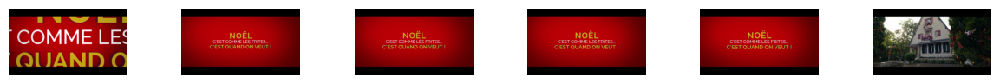

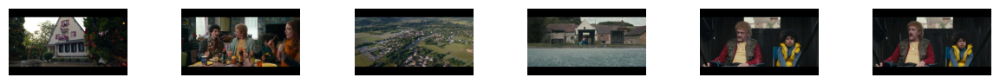

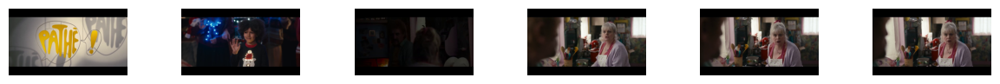

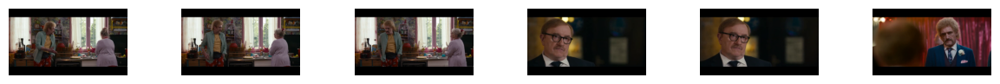

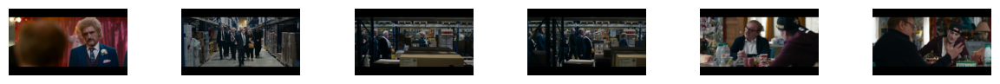

...

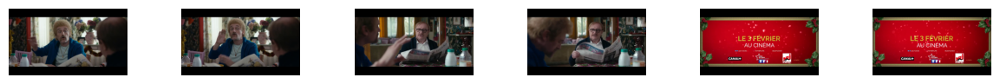

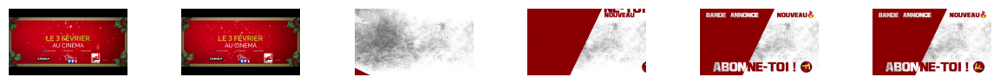

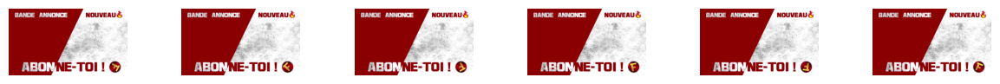

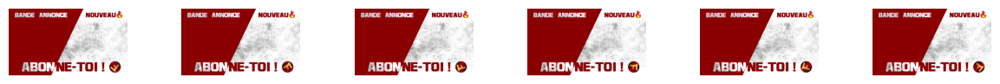

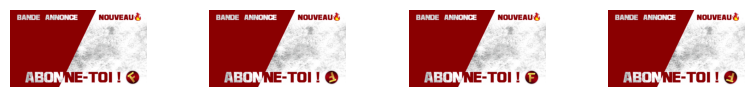

In [6]:
video.show_frames()

# Finding all faces and predicting gender

In [7]:
from bechdelai.image.face_detection import FacesDetector
from bechdelai.image.gender_detection import GenderDetector

In [8]:
fd = FacesDetector()
gd = GenderDetector()

Loading CLIP model


## Test on one frame

For one frame we can use RetinaFace easily for higher accuracy

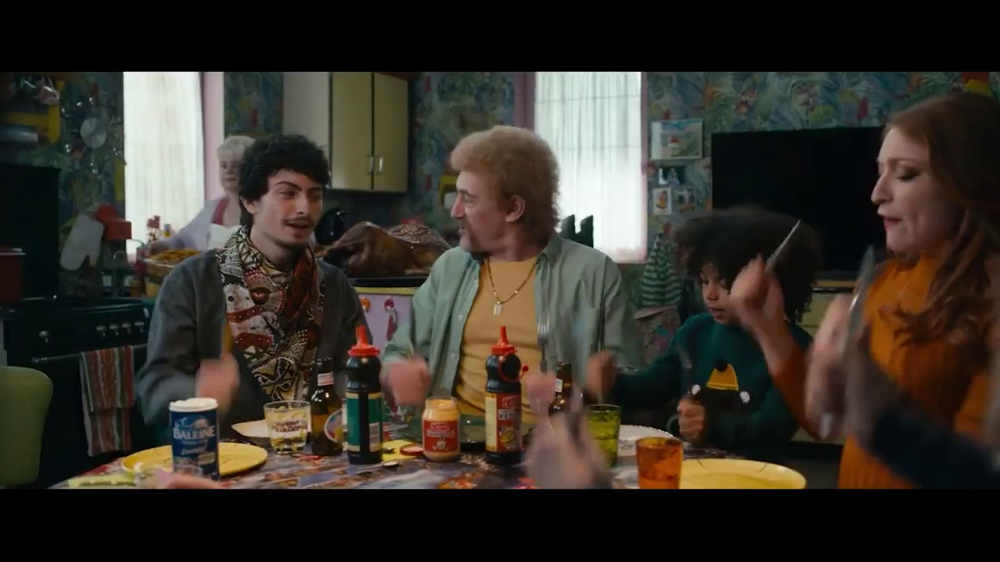

In [9]:
#chose the frame 
img = video.frames[7]
img

In [27]:
from bechdelai.image.utils import show_faces_on_image, show_all_faces

We can chose the method to identify the faces, retinaface provides higher accuracy

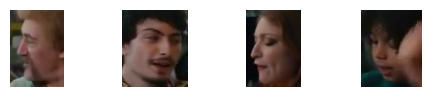

CPU times: total: 15 s
Wall time: 1.71 s


In [28]:
%%time
rois,faces = fd.detect(img.array,method = "retinaface",padding = 10)
show_all_faces(faces)

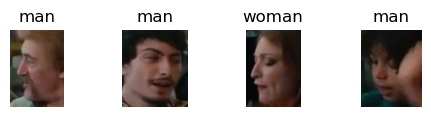

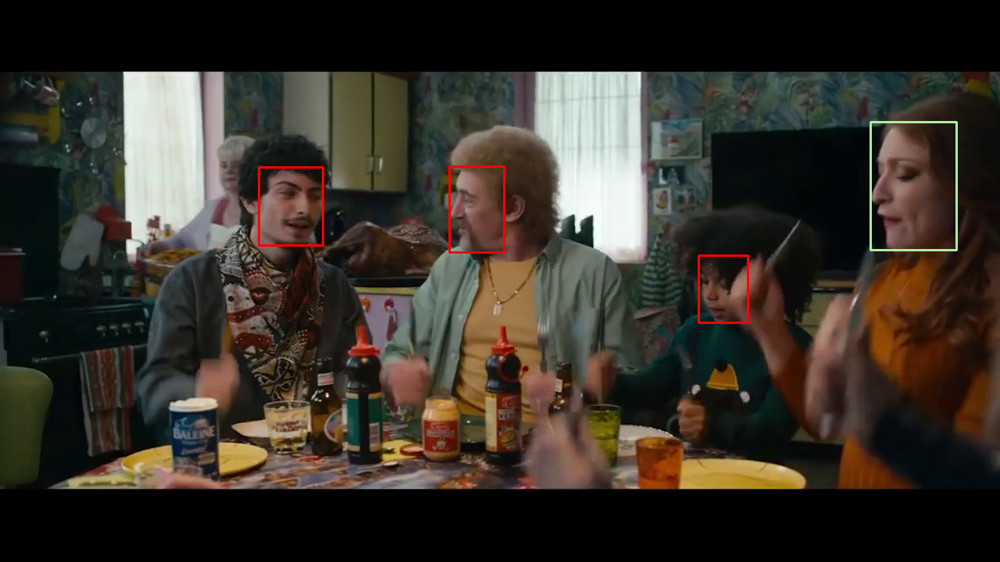

In [29]:
probas = gd.predict(faces,img = img.array)
show_all_faces(faces,titles = probas["gender"])

show_faces_on_image(img.array,rois,genders = probas["gender"])

The probas table provides the probability for each class and the area of the region of interest (i.e the face)

In [30]:
probas

,man,woman,diff,gender,area,area_percentage_relative,area_percentage_total
0,0.990690,0.009310,0.981380,man,11700,0.206502,0.012695
1,0.991209,0.008791,0.982419,man,12240,0.216033,0.013281
2,0.210460,0.789540,0.579079,woman,23920,0.422182,0.025955
3,0.971359,0.028641,0.942717,man,8798,0.155283,0.009546


We can use the analyse_probas method to have the statistics about the gender gaps in the frame.

In [31]:
r,m = gd.analyze_probas(probas)

In [32]:
m

{'women_area': 0.4221822161036394,
 'men_area': 0.5778177838963606,
 'n_women': 1,
 'n_men': 3,
 'ratio_count': '3.0x 🧑',
 'ratio_area': '1.4x 🧑',
 'n_characters': 4,
 'area_gap': 0.7306493982527948,
 'count_gap': 0.3333333333333333}

## Application on all frames of the movie sample

  0%|          | 0/118 [00:00<?, ?it/s]

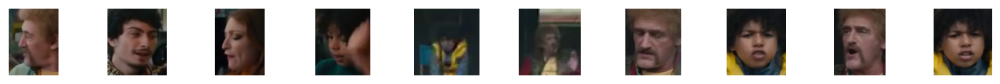

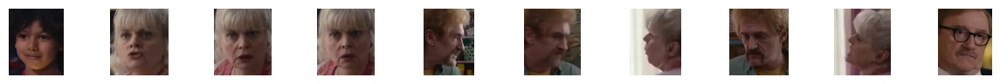

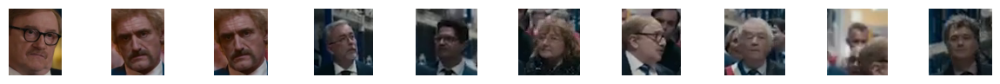

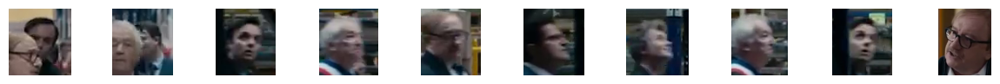

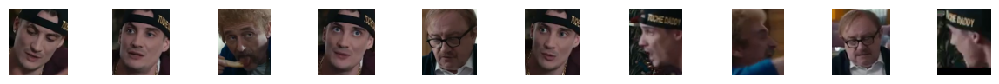

...

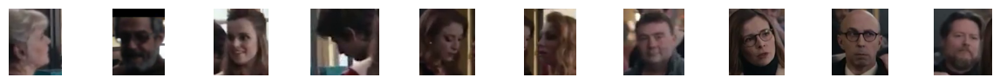

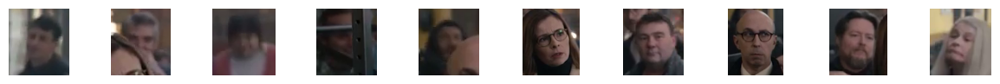

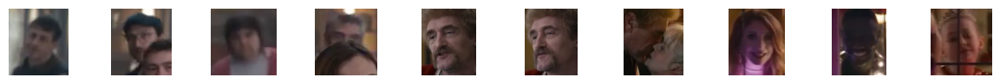

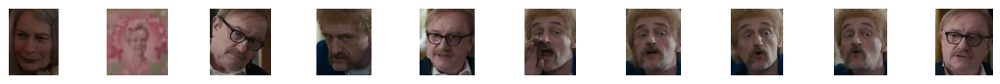

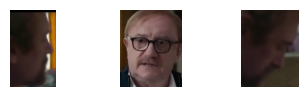

In [34]:
faces,faces_metadata, rois_list = fd.detect_many(video,method = "retinaface",padding = 20)
show_all_faces(faces)

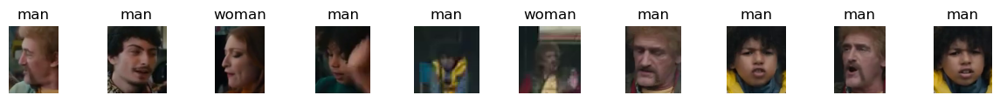

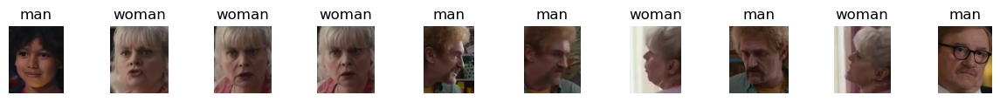

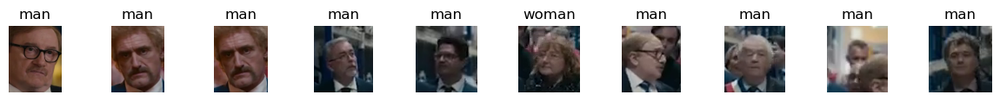

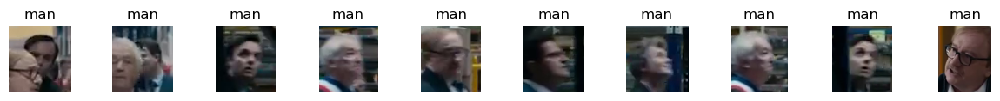

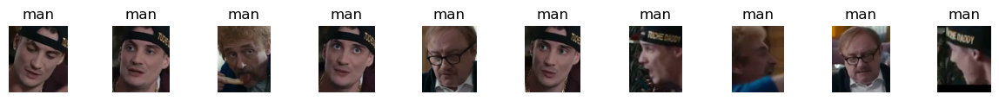

...

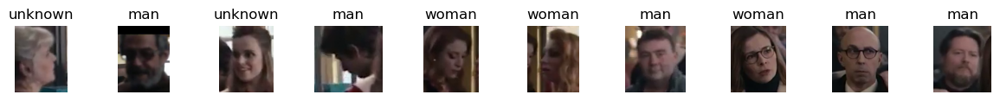

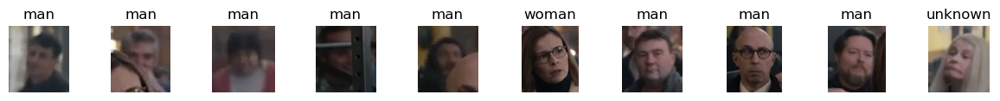

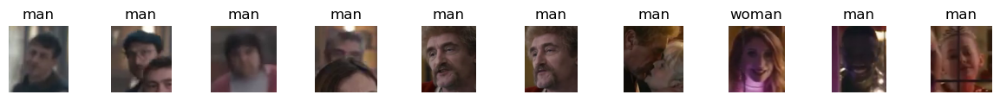

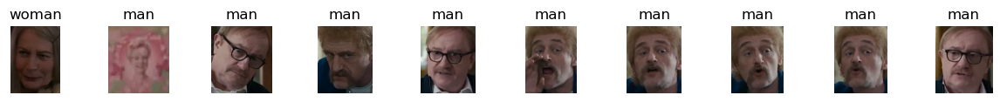

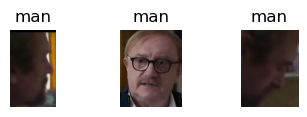

In [36]:
probas,annotations, annotations_dict = gd.predict(faces,faces_metadata)
video.reset_annotations()
video.annotate(annotations)
show_all_faces(faces,titles = probas["gender"].tolist())

In [37]:
video.replay()

interactive(children=(Play(value=0, description='Press play', interval=500, max=117), Output()), _dom_classes=…

IntSlider(value=0, max=117)

# work in progress...

### Regroup faces together

In [189]:
# video.resize(width = 500)

In [38]:
faces,faces_metadata, rois_list = fd.detect_many(video,method = "ssd")

  0%|          | 0/118 [00:00<?, ?it/s]

deploy.prototxt will be downloaded...


Downloading...
From: https://github.com/opencv/opencv/raw/3.4.0/samples/dnn/face_detector/deploy.prototxt
To: C:\Users\carol\.deepface\weights\deploy.prototxt

28.1kB [00:00, 14.1MB/s]                   


res10_300x300_ssd_iter_140000.caffemodel will be downloaded...


Downloading...
From: https://github.com/opencv/opencv_3rdparty/raw/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
To: C:\Users\carol\.deepface\weights\res10_300x300_ssd_iter_140000.caffemodel

  0%|          | 0.00/10.7M [00:00<?, ?B/s]
 20%|█▉        | 2.10M/10.7M [00:00<00:00, 20.9MB/s]
 39%|███▉      | 4.19M/10.7M [00:00<00:00, 20.0MB/s]
 69%|██████▉   | 7.34M/10.7M [00:00<00:00, 24.1MB/s]
100%|██████████| 10.7M/10.7M [00:00<00:00, 23.3MB/s]


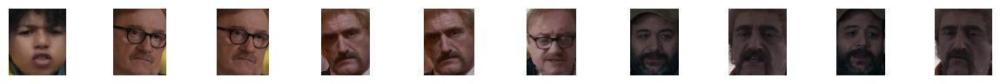

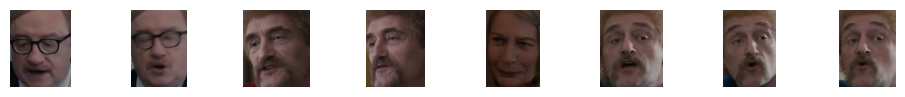

In [39]:
show_all_faces(faces)

In [42]:
from bechdelai.image.face_detection import HiddenPrints

In [44]:
from deepface import DeepFace

In [56]:
embeddings = []

for face in tqdm(faces):
    with HiddenPrints():
        emb = DeepFace.represent(np.array(face),model_name = "ArcFace",enforce_detection=False)
    embeddings.append(np.array(emb[0]['embedding']))
    
embeddings = np.stack(embeddings)

  0%|          | 0/18 [00:00<?, ?it/s]

In [57]:
embeddings2D = fd.reduce_embeddings(embeddings)


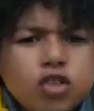
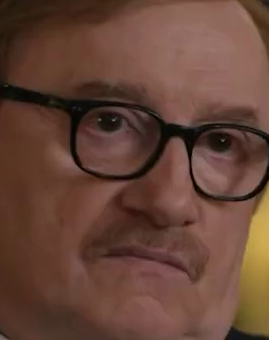
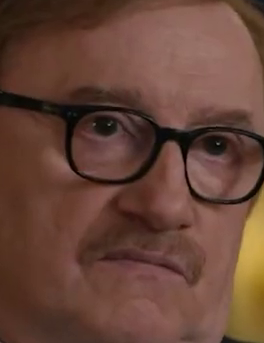
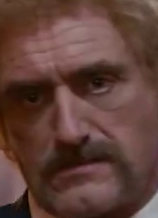
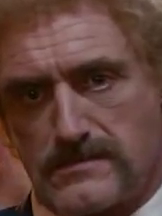
...
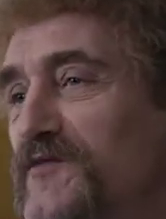
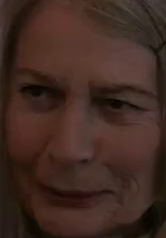
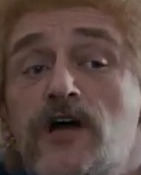
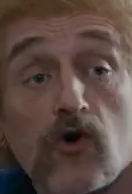
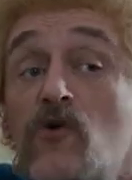

In [58]:
fd.show_embeddings2D(embeddings2D,faces)

In [59]:
from scipy.spatial import distance_matrix

In [60]:
from sklearn.metrics import pairwise_distances

In [61]:
dm = pairwise_distances(embeddings,metric = "cosine")

In [62]:
import plotly.express as px
fig = px.imshow(dm)
fig.show()

In [63]:
np.median(dm)

0.8114059185659467

In [64]:
from sklearn.cluster import DBSCAN,MeanShift

In [65]:
ms = MeanShift(bandwidth = 3.4)

In [66]:
clusters = ms.fit_predict(embeddings)
clusters

array([7, 0, 0, 4, 4, 0, 3, 2, 3, 2, 0, 0, 5, 5, 6, 1, 1, 1], dtype=int64)

Cluster 0


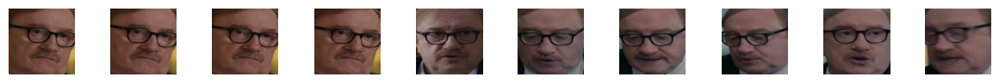

<Figure size 1500x100 with 0 Axes>

Cluster 1


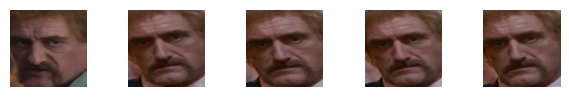

Cluster 2


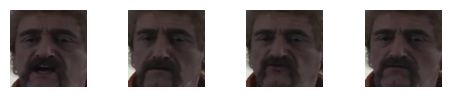

Cluster 3


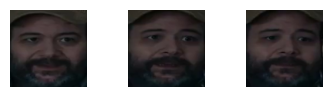

Cluster 4


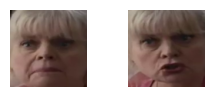

Cluster 5


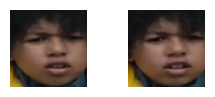

Cluster 6


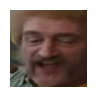

Cluster 7


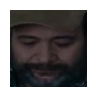

Cluster 8


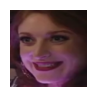

Cluster 9


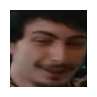

In [87]:
fd.show_faces_by_cluster(faces,clusters)

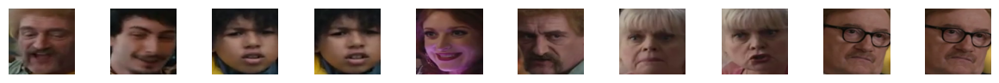

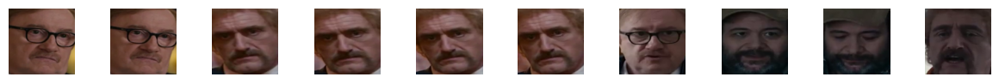

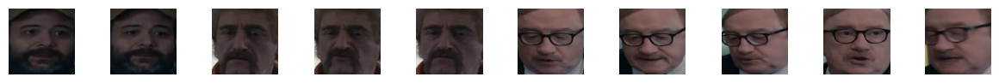

<Figure size 1500x100 with 0 Axes>

In [179]:
fd.show_all_faces(faces)

### Gender with CLIP

In [140]:
from bechdelai.image.clip import CLIP
from bechdelai.image.gender_detection import GenderDetector

In [141]:
gd = GenderDetector()

Loading CLIP model


In [145]:
probas,annotations = gd.predict(faces,faces_metadata)

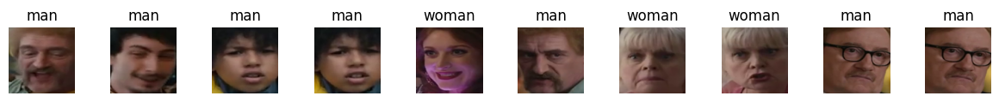

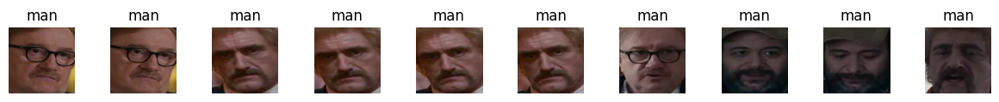

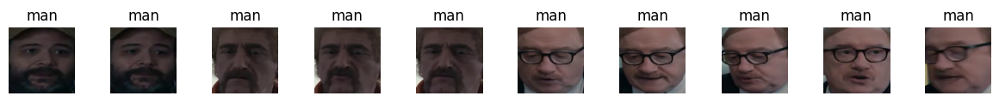

<Figure size 1500x100 with 0 Axes>

In [146]:
fd.show_all_faces(faces,titles = probas["gender"].tolist(),columns = 10)

In [158]:
video.reset_annotations()

In [159]:
video.annotate(annotations)

In [160]:
video.replay()

interactive(children=(Play(value=0, description='Press play', interval=500, max=125), Output()), _dom_classes=…

IntSlider(value=0, max=125)

## Analyzing frames with ViLT

In [3]:
from bechdelai.image.vilt import ViLT

In [4]:
vilt = ViLT()

Loading ViLT model


In [5]:
len(video.frames)

118

In [26]:
preds_i,probas_i = vilt.predict(video.frames[10],["How many women ?","How many men ?"])

In [27]:
preds_i

[   rank answer     proba
 0     0      2  0.637255
 1     1      1  0.352919
 2     2      3  0.006494
 3     3      0  0.001811
 4     4      4  0.000498,
    rank answer     proba
 0     0      0  0.677432
 1     1      1  0.290764
 2     2      2  0.029414
 3     3      3  0.000882
 4     4     no  0.000413]

In [8]:
%%time
preds,probas = vilt.predict_many(video.frames,["How many women ?","How many men ?"])

  0%|          | 0/118 [00:00<?, ?it/s]

CPU times: total: 24min 36s
Wall time: 9min 3s


In [38]:
final_preds = preds.query("proba > 0.9").query("rank==0")
final_preds = final_preds.pivot(index = "image_id",columns = "question",values = "answer").fillna("0")
final_preds

question,How many men ?,How many women ?
image_id,,
1,0,0
2,0,0
3,0,0
4,0,0
5,0,0
...,...,...
110,0,0
112,0,0
113,0,0


In [39]:
video.annotate(final_preds.to_dict(orient = "index"))
video.replay()

interactive(children=(Play(value=0, description='Press play', interval=500, max=117), Output()), _dom_classes=…

IntSlider(value=0, max=117)

In [13]:
from bechdelai.utils.timeline import convert_to_timeline,fn_timeline,fn_create_sequence_id

In [18]:
women = final_preds["How many women ?"].reset_index()
women.columns = ["frame_id","pred"]
women["sequence_id"] = fn_create_sequence_id(women["pred"])

In [19]:
x = convert_to_timeline(women,description_col = "pred",show = False)

In [37]:
import plotly.express as px

fig = px.timeline(x,
                  x_start = "start",
                  x_end = "end",
                  y = "pred",
                  color = "pred",
#                   range_x = [0,max(x["end"])],
                  color_discrete_sequence = px.colors.qualitative.Alphabet
                 )

# fig.update_traces(mode="markers+lines", hovertemplate=None)
fig.update_layout(hovermode="x")

fig


# Scene detection & change detection
- https://www.amazon.science/blog/automatically-identifying-scene-boundaries-in-movies-and-tv-shows
- https://github.com/wanglimin/MRCNN-Scene-Recognition
- https://scenedetect.com/projects/Manual/en/latest/api.html#quickstart
- https://scenedetect.com/projects/Manual/en/latest/api.html#example
- https://paperswithcode.com/task/scene-change-detection

In [6]:
from bechdelai.video.utils import get_frame_from_cap
from bechdelai.video.utils import extract_frames_from_video
from bechdelai.video.utils import extract_frames_from_scenes
from bechdelai.video.utils import show_frames

In [7]:
from bechdelai.video.video import Video

In [125]:
%%time
video = Video(path = video_path,detect_scenes = True)

Detected: 61 | Progress: : 2817frames [00:08, 326.47frames/s]

Detected 62 scenes in the video


  0%|          | 0/62 [00:00<?, ?it/s]

CPU times: total: 41.6 s
Wall time: 14.2 s


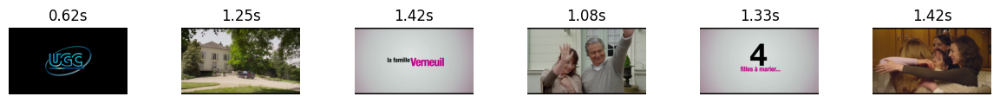

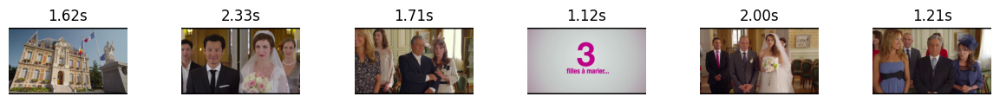

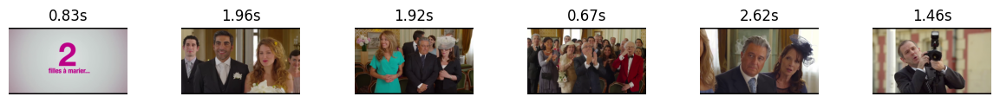

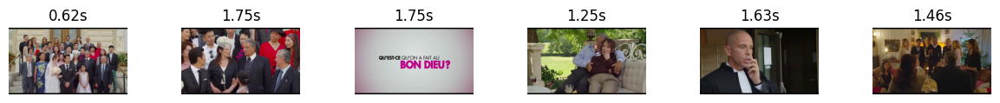

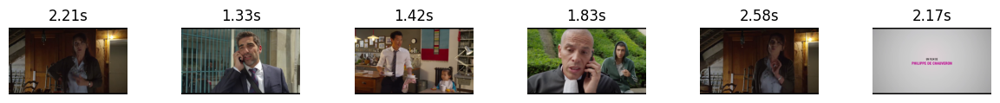

...

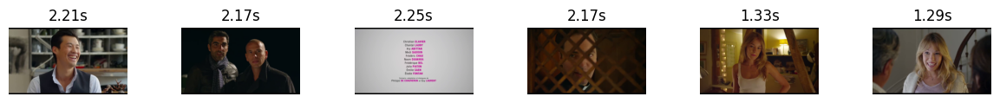

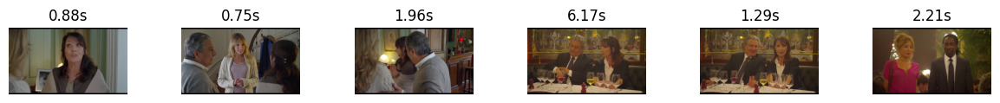

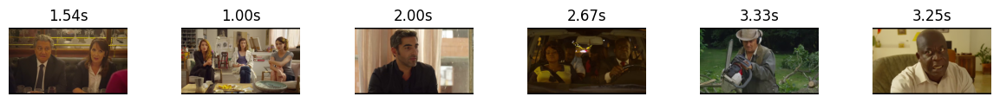

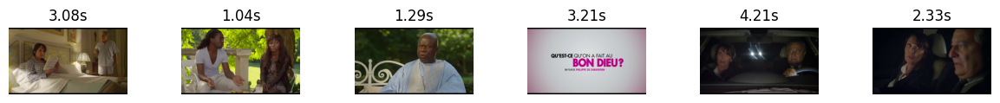

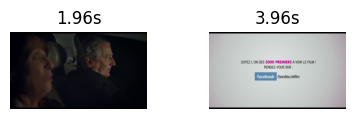

In [126]:
video.show_frames(titles = video.scenes_durations)

In [83]:
from bechdelai.image.face_detection import FacesDetector
from bechdelai.image.gender_detection import GenderDetector
from bechdelai.image.utils import show_all_faces,show_faces_on_image

fd = FacesDetector()
gd = GenderDetector()

Loading CLIP model


  0%|          | 0/62 [00:00<?, ?it/s]

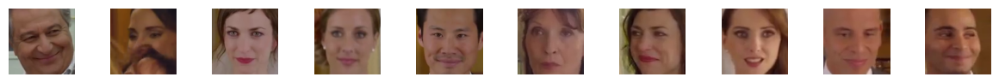

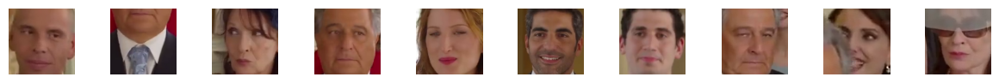

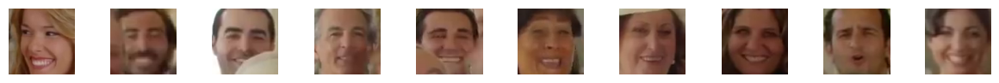

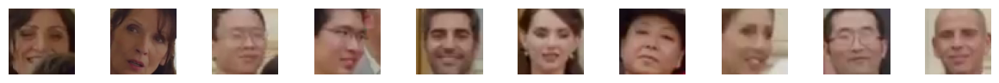

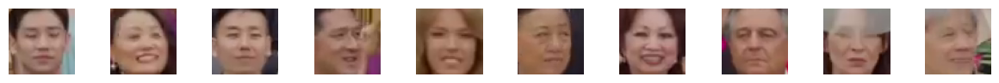

...

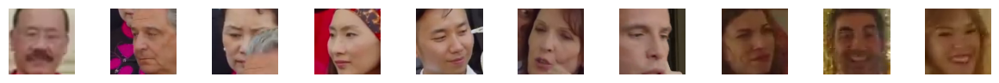

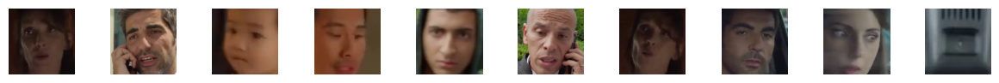

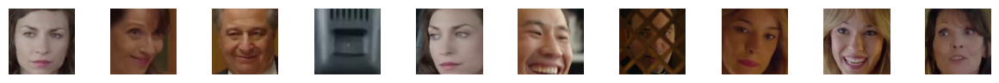

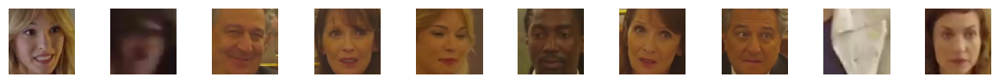

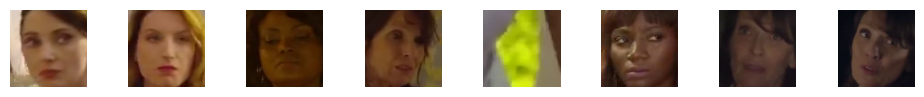

In [127]:
faces,faces_metadata,rois_list = fd.detect_many(video,method = "opencv",padding = 0)
show_all_faces(faces)

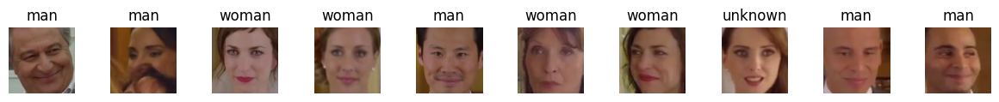

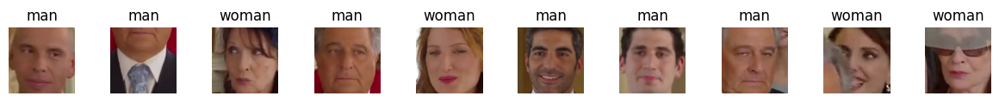

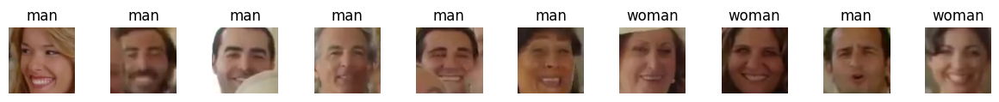

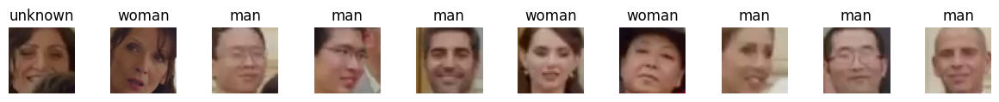

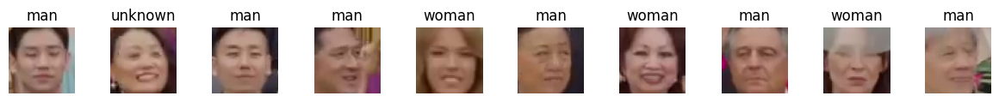

...

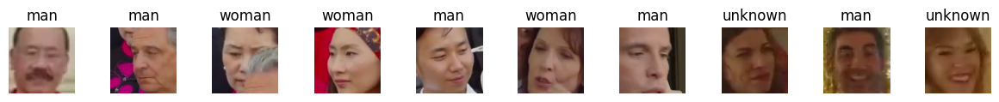

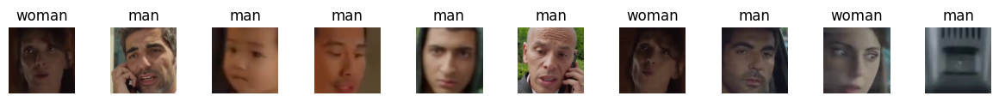

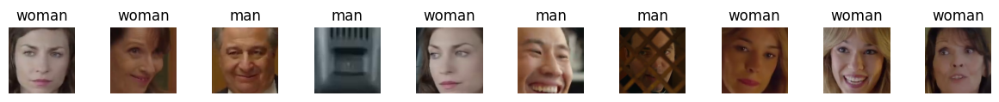

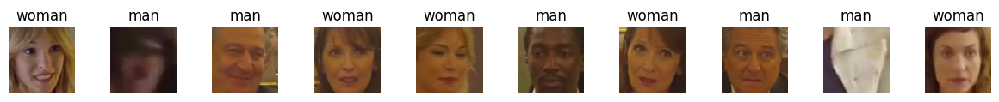

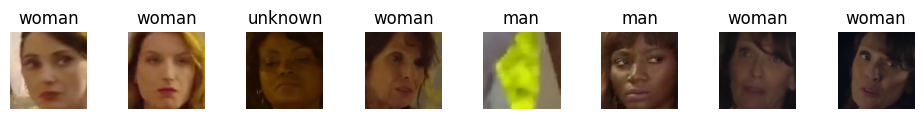

In [128]:
probas,annotations_data,annotations_dict = gd.predict(faces,faces_metadata)
video.reset_annotations()
video.annotate(annotations_dict)
show_all_faces(faces,titles = probas["gender"].tolist())

In [129]:
timeline_gender = (annotations_data
 .reindex(labels = range(len(video.frames)))
 .fillna(0.0)
 .assign(duration = lambda _ : [x.duration for x in video.scenes])
 .assign(end = lambda x : x["duration"].cumsum())
 .assign(start = lambda x : x["end"].shift(1).fillna(0.0))
 .melt(ignore_index = False,id_vars = ["duration","start","end"])
 .assign(start_date = lambda x : pd.to_datetime("2022-01-01") + x["start"].map(lambda y : pd.Timedelta(seconds = y)))
 .assign(end_date = lambda x : pd.to_datetime("2022-01-01") + x["end"].map(lambda y : pd.Timedelta(seconds = y)))
)

In [130]:
import plotly.express as px

In [133]:
px.timeline(
    timeline_gender.query("gender!='unknown'"),x_start = "start_date",x_end = "end_date",color = "value",y = "gender",
    color_continuous_scale= "Blues",color_continuous_midpoint=5
)

In [86]:
video.add_rois(rois_list)

In [87]:
video.replay()

interactive(children=(Play(value=0, description='Press play', interval=500, max=66), Output()), _dom_classes=(…

IntSlider(value=0, max=66)

In [90]:
probas

,man,woman,diff,gender,area,area_percentage_relative
0,0.981608,0.018392,0.963217,man,10404,0.009337
1,0.992388,0.007612,0.984776,man,18496,0.016599
2,0.996047,0.003953,0.992095,man,12544,0.011257
3,0.885506,0.114494,0.771013,man,47961,0.043042
4,0.979703,0.020297,0.959405,man,21025,0.018868
5,0.552241,0.447759,0.104481,woman,22201,0.019924
6,0.453428,0.546572,0.093144,unknown,25281,0.022688
7,0.993312,0.006688,0.986624,man,12769,0.011459
8,0.967119,0.032881,0.934239,man,31329,0.028116
9,0.220504,0.779496,0.558992,woman,33489,0.030054


In [88]:
probas

,man,woman,diff,gender,area,area_percentage_relative
0,0.981608,0.018392,0.963217,man,10404,0.009337
1,0.992388,0.007612,0.984776,man,18496,0.016599
2,0.996047,0.003953,0.992095,man,12544,0.011257
3,0.885506,0.114494,0.771013,man,47961,0.043042
4,0.979703,0.020297,0.959405,man,21025,0.018868
5,0.552241,0.447759,0.104481,woman,22201,0.019924
6,0.453428,0.546572,0.093144,unknown,25281,0.022688
7,0.993312,0.006688,0.986624,man,12769,0.011459
8,0.967119,0.032881,0.934239,man,31329,0.028116
9,0.220504,0.779496,0.558992,woman,33489,0.030054


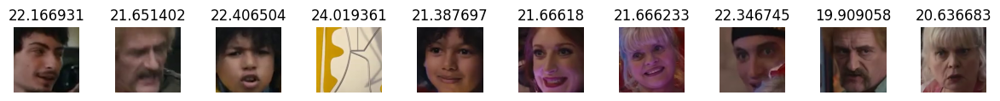

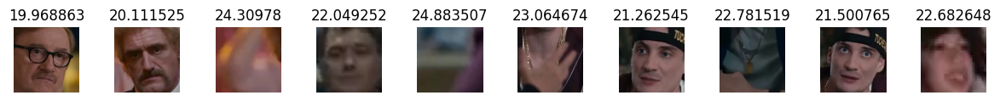

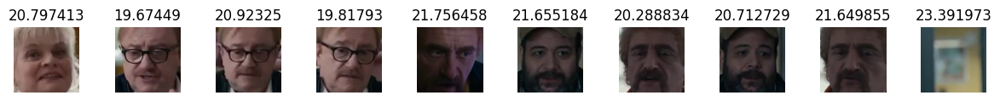

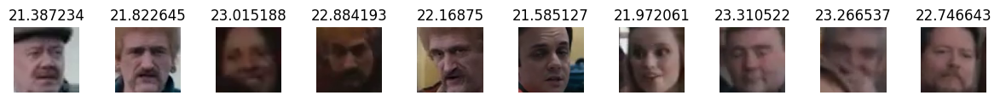

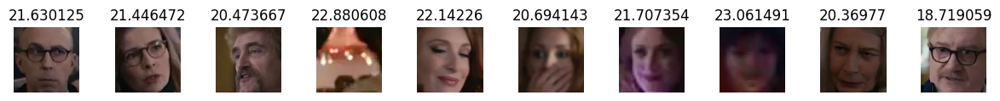

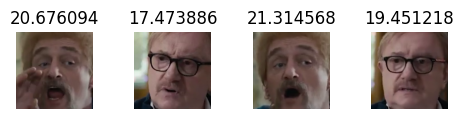

In [61]:
fd.show_all_faces(faces,titles = logits["background"])

In [44]:
gd.model.predict(faces[2])

(         man      woman       face
 0  26.297098  20.767666  24.128033,
         man     woman      face
 0  0.894252  0.003549  0.102199)

In [31]:
# video.resize(width = 400)

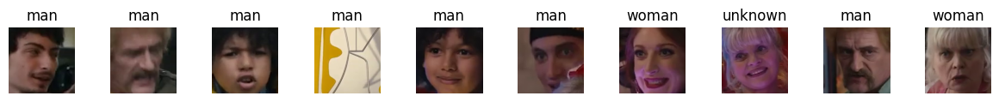

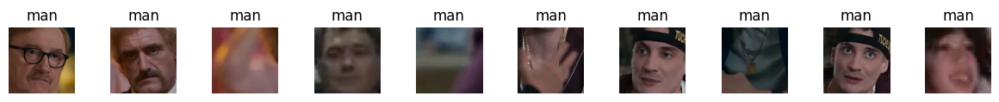

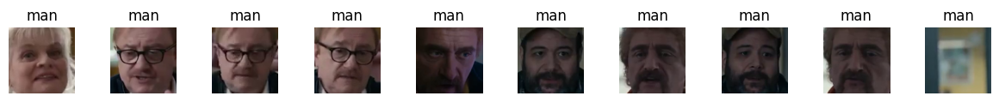

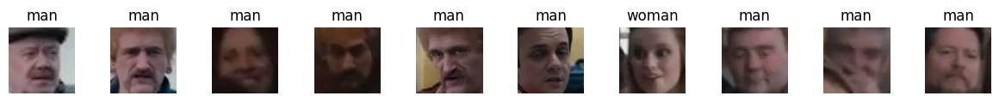

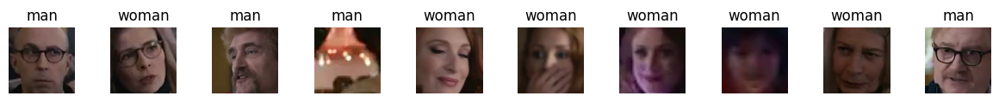

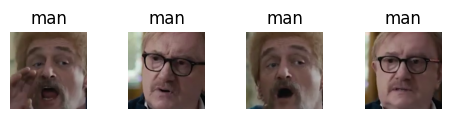

In [34]:
probas,annotations = gd.predict(faces,faces_metadata)
video.reset_annotations()
video.annotate(annotations)
fd.show_all_faces(faces,titles = probas["gender"].tolist())

In [11]:
# # video = open_video(video_path)
# for i, scene in enumerate(scene_list):
#     print("-"*100)
#     print(f"Scene {i} - {scene}")
#     frame_start,frame_end = scene[0].get_frames(),scene[1].get_frames()
#     _,frames = extract_frames_from_video(cap,fps = 1,frame_start = frame_start,frame_end = frame_end,max_seconds = None,progress = False)
#     show_frames(frames)

In [130]:
# for i, scene in enumerate(scene_list):
#     print('Scene %2d: Start %s / Frame %d, End %s / Frame %d' % (
#         i+1,
#         scene[0].get_timecode(), scene[0].get_frames(),
#         scene[1].get_timecode(), scene[1].get_frames(),))

# Software
- https://pythonvideoannotator.readthedocs.io/en/master/index.html
- https://www.viametoolkit.org/
- https://github.com/dsgou/annotator
- https://github.com/heartexlabs/labelImg
- https://github.com/opencv/cvat

En particulier tester https://github.com/video-annotator/pythonvideoannotator

# Tester un software qui existe déjà ?
- https://www.tator.io/